
<h2 align="center">Visual illusions and interactions in biologically inspired neural networks. Analyzing perception of tilt</h2> 

Below are some functions definitions that we will need 

In [1]:
# Imports
import math as m
import numpy as np
import matplotlib.pyplot as plt
import holoviews as hv
import pylab as pl
from pylab import exp,cos,sin,pi,tan, pi
import pandas as pd
import seaborn as sb
import holoviews as hv
from IPython.display import SVG
import io
from PIL import Image
from random import random
import elastica as el
import elastica_neurons as en
from dynamics import *
%matplotlib inline
hv.notebook_extension()

/afs/inf.ed.ac.uk/user/s12/s1247380/Documents/HonoursProject/Python/venv/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
%output max_frames = 2000

Set breakpoint in notebooks(and python in general)

In [3]:
#import pdb; pdb.set_trace()

:HoloMap   [Angle]
   :Curve   [x]   (y)
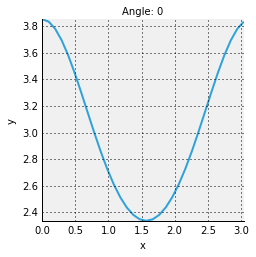
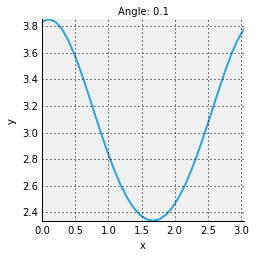
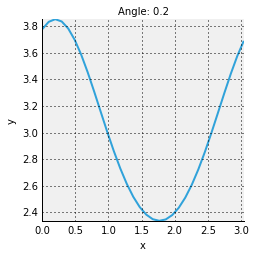
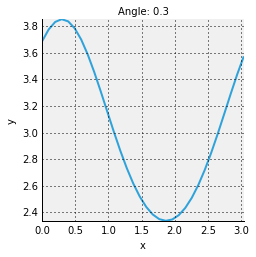
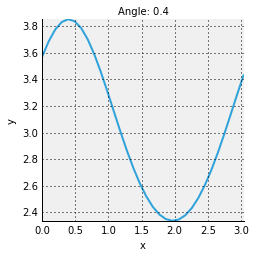
...
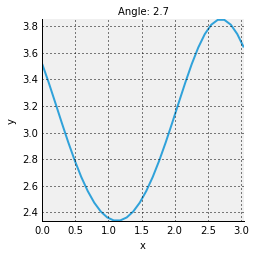
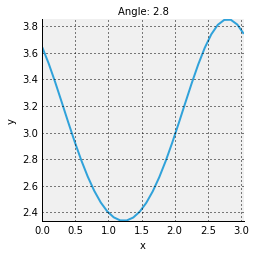
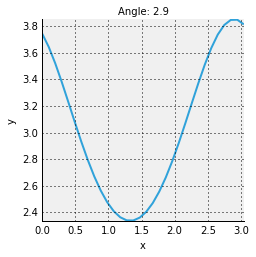
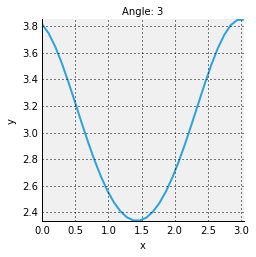
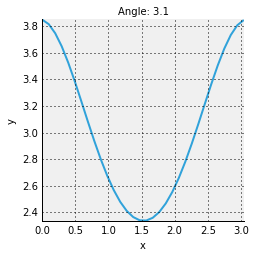

In [4]:
# Output of different orientation selective neurons for given orienatation
k = 0.25;
A = 3;
data = {angle:(mises_curve(A,k,angle)[0])
        for angle in np.arange(0, pi, 0.1)}
levels = hv.HoloMap(data, kdims=['Angle']).collate()
levels

This time we specify number of orientation selective neurons as well.

In [10]:
# Generate the data
angle_neurons = [(angle,neurons) for angle in np.arange(0, pi, 0.1) for neurons in range(1,30,1)]
data = [(angle_neuron, mises_curve(A,k,angle_neuron)[0]) for angle_neuron in angle_neurons]
len(data)

928

In [11]:
# Display the responses
vonMises = hv.HoloMap(data, kdims=['Angle', 'Neurons'])
vonMises

:HoloMap   [Angle,Neurons]
   :Curve   [x]   (y)

(-0.5, 214.5, 214.5, -0.5)

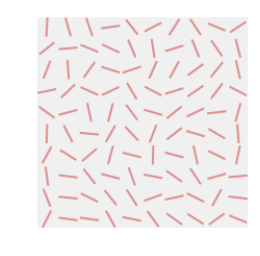

In [24]:
# Visualization of orienatations

from random import random


renderer = hv.Store.renderers['matplotlib'].instance(fig='png', holomap='gif')


x_ind = []
y_ind = []
theta = []
#theta = np.pi*np.arange(100)/100
theta = np.pi*np.random.rand(100)
for i in range(0,10):
    for j in range(0,10):
        x_ind.append(i)
        y_ind.append(j)
        #theta.append(random())
        
bars1 = plotbar(x_ind,y_ind,theta,l=0.9)

renderer.save(bars1, 'example_I')
img=plt.imread('example_I.png')

#plt.figure(figsize = (7,7)
plt.imshow(img)
plt.axis('off')


:Curve   [x]   (y)
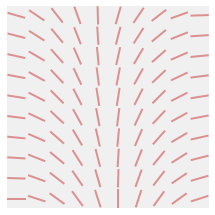

In [25]:
# Visualization of orienatations

from random import random


renderer = hv.Store.renderers['matplotlib'].instance(fig='svg', holomap='gif')


x_ind = []
y_ind = []
theta = []
theta = np.pi*np.arange(100)/100
for i in range(0,10):
    for j in range(0,10):
        x_ind.append(i)
        y_ind.append(j)
        #theta.append(random())
        
bars1 = plotbar(x_ind,y_ind,theta,l=0.9)

bars1


In [26]:
# Saving multiple images in a directory

from random import random


renderer = hv.Store.renderers['matplotlib'].instance(fig='svg', holomap='gif')

bars = []
for k in range(10):
    x_ind = []
    y_ind = []
    theta = []
    for i in range(0,10):
        for j in range(0,10):
            x_ind.append(9-i)
            y_ind.append(j)
            theta.append(random())
    bars1 = plotbar(x_ind,y_ind,theta,l=0.9)
    bars1 = plotbar(x_ind,y_ind,theta,l=0.9)
    #hv.help(bars1)
    renderer.save(bars1, 'test/example_'+str(k), plot= dict(Curve={'yaxis':None, 'xaxis':None}))


:RGB   [x,y]   (R,G,B,A)
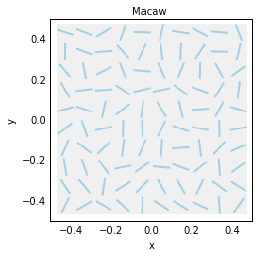

In [9]:
# Visualize image
from holoviews import RGB
parrot = RGB.load_image('example_I.png', array=True)
rgb_parrot = RGB(parrot, label='Macaw')
rgb_parrot

In [10]:
# Visualize matrix
theta = np.reshape(theta, ((10,10)))
f = open('test.txt','w')
f.write(np.array_str(theta.T, precision=2))
f.close()
print (np.array_str(theta.T, precision=2))

[[ 0.84  0.46  0.37  0.43  0.51  0.17  0.37  0.71  0.53  0.77]
 [ 0.72  0.67  0.94  0.11  0.11  0.98  0.4   0.84  0.5   0.02]
 [ 0.55  0.7   0.79  0.35  0.87  0.84  0.12  0.88  0.8   0.42]
 [ 0.5   0.21  0.34  0.99  0.74  0.58  0.16  0.35  0.89  0.47]
 [ 0.88  0.62  0.63  0.21  0.36  0.6   0.11  0.14  0.91  0.28]
 [ 0.33  0.85  0.51  0.6   0.91  0.08  0.42  0.66  0.93  0.53]
 [ 0.7   0.2   0.53  0.75  0.31  0.02  0.65  0.81  0.02  0.7 ]
 [ 0.52  0.56  0.3   0.92  0.82  0.58  0.59  0.78  0.84  0.61]
 [ 0.08  0.52  0.58  0.91  0.19  0.94  0.49  0.46  0.64  0.51]
 [ 0.23  0.94  0.11  0.93  0.63  0.22  0.29  0.78  0.08  0.57]]


Holoviews (Matlab as well) come with fairly limited number of plotting colors (5). This means that after plotting more than five curves, the colors will start repeating, leading to confusing plots. This methods goes inside the variable in the Holoviews library, responsible for cycling the different colors for plotting. The colors are based on different value of hue, with the same values for saturation and value, so we get a nice gamma of different colors. The number of colors can be set, so depending on the need of colors, we get the best contrast.

Translation from Matlab to Python - indexing of matrices - Matlab:row first, column second, Python the opposite


Limited connectivity

In [5]:
%%output
a=1

%output info=False holomap='widgets' max_branches=2 max_frames=500 dpi=72 filename=None
      charwidth=80 fig='png' fps=20 widgets='embed' backend='matplotlib' css={}
      size=100

For help with the %output magic, call %output?


:Curve   [x]   (y)
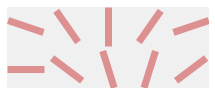

In [7]:
a = visualField(ac_orient, aspect=5/2.0)
a

In [20]:
ac_orient

array([[ 0.        ,  0.31415927],
       [ 0.62831853,  0.9424778 ],
       [ 1.25663706,  1.57079633],
       [ 1.88495559,  2.19911486],
       [ 2.51327412,  2.82743339]])

Throught the implementation, everything was built to be as simple as possible, but extended when needed.
Examples:
Input can be any size matrix
A lot of the methods have default value paramenters, which can be changed as needed


> /afs/inf.ed.ac.uk/user/s12/s1247380/Documents/HonoursProject/Python/dynamics.py(103)plotOneField2()
    101         magnitude[i] = max(rs[i,k[0],k[1],:])
    102     size = m.sqrt(len(orientations))
--> 103     result = visualField3(orientations.reshape(size,size), magnitude.reshape(size,size))
    104     return result
    105     #return hv.Curve(zip(t,rs[:,1,1,:]))

ipdb> cont


:Layout
   .HoloMap.I  :HoloMap   [X,Y]
      :Curve   [x]   (y)
   .HoloMap.II :HoloMap   [X,Y]
      :Overlay
         .Points.I    :Points   [x,y]
         .Points.II   :Points   [x,y]
         .Points.III  :Points   [x,y]
         .Points.IV   :Points   [x,y]
         .Points.V    :Points   [x,y]
         .Points.VI   :Points   [x,y]
         .Points.VII  :Points   [x,y]
         .Points.VIII :Points   [x,y]
         .Points.IX   :Points   [x,y]
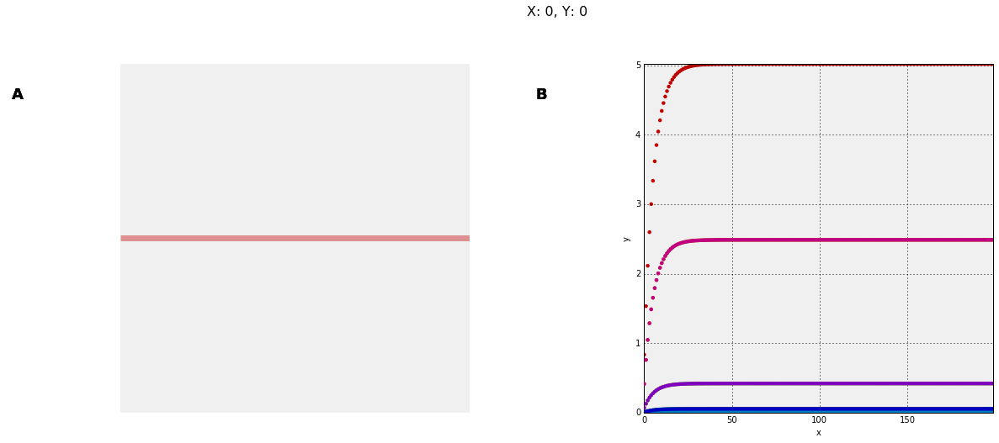
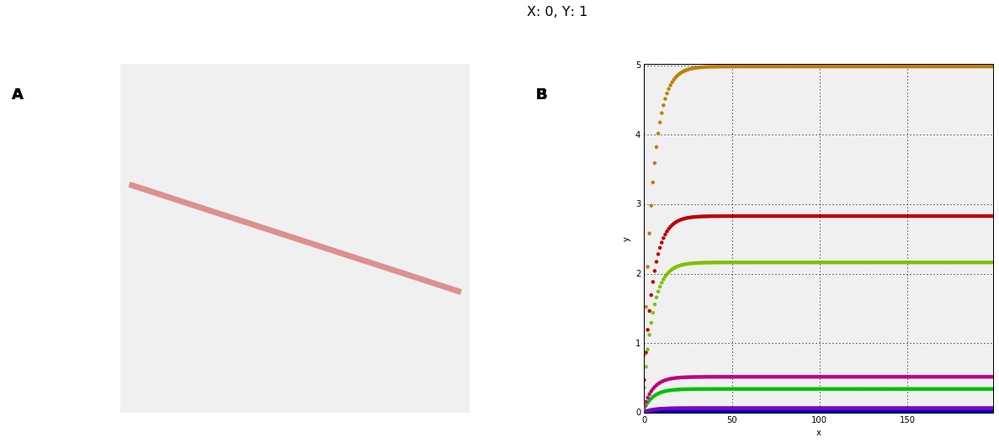
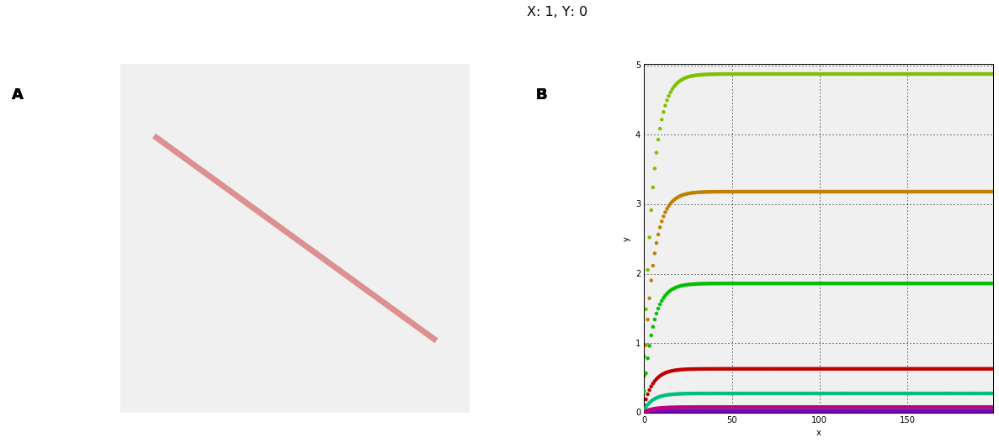
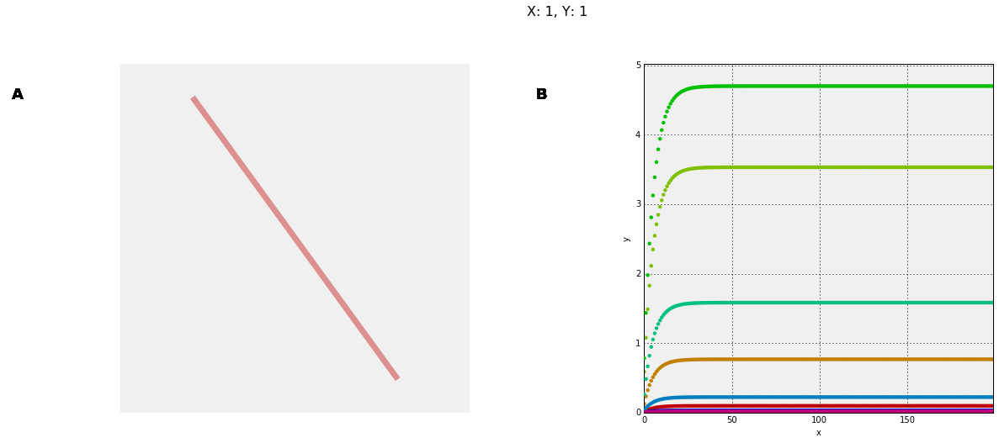
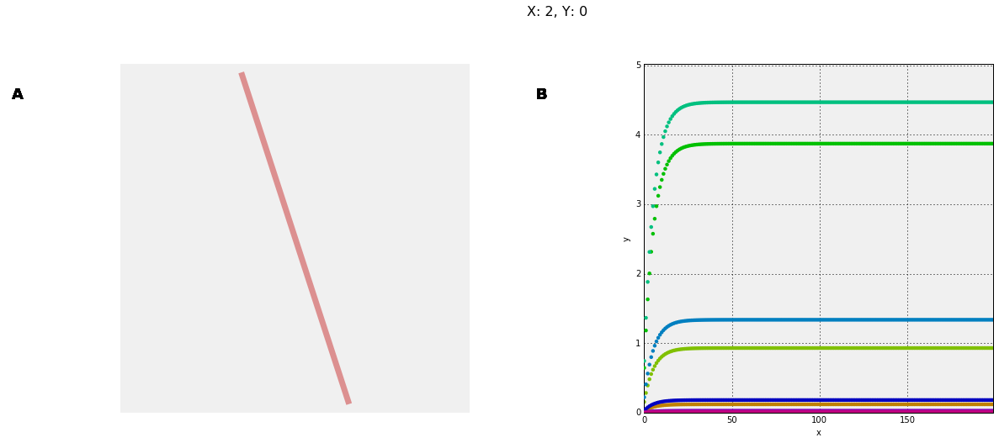
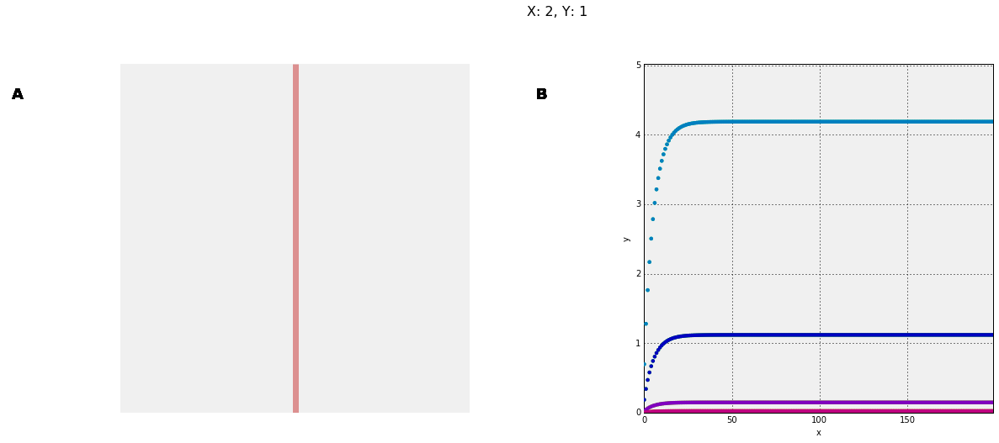
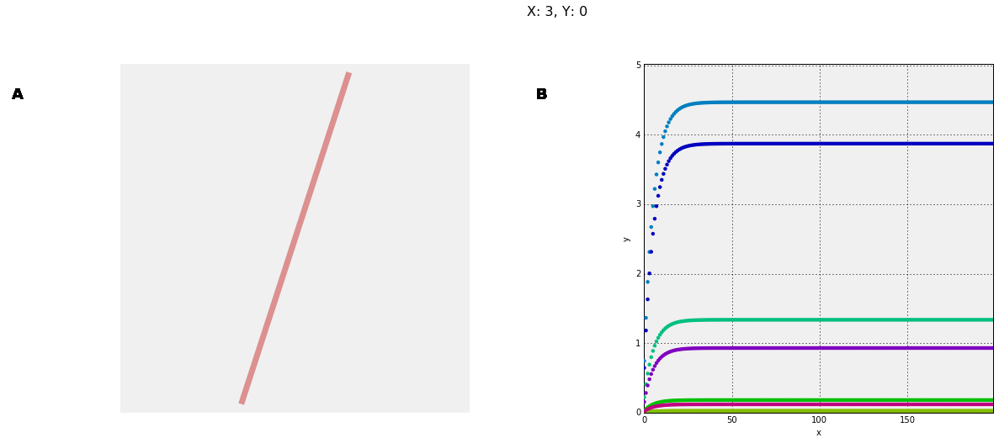
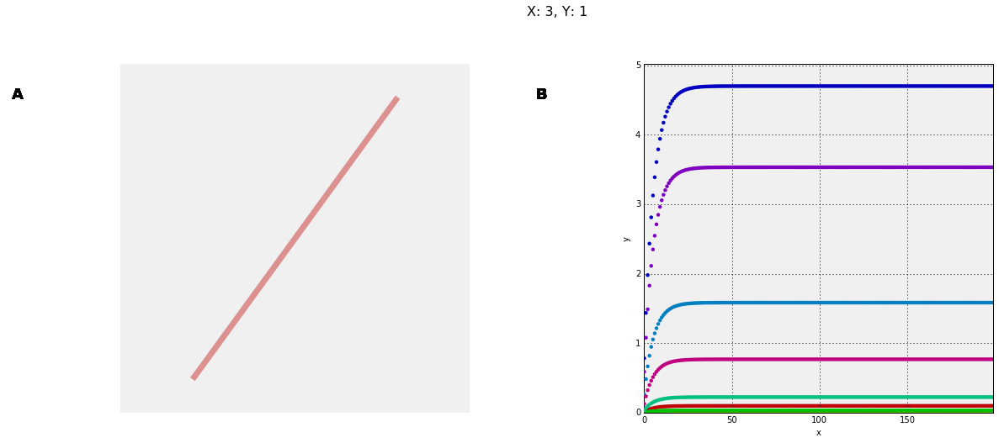
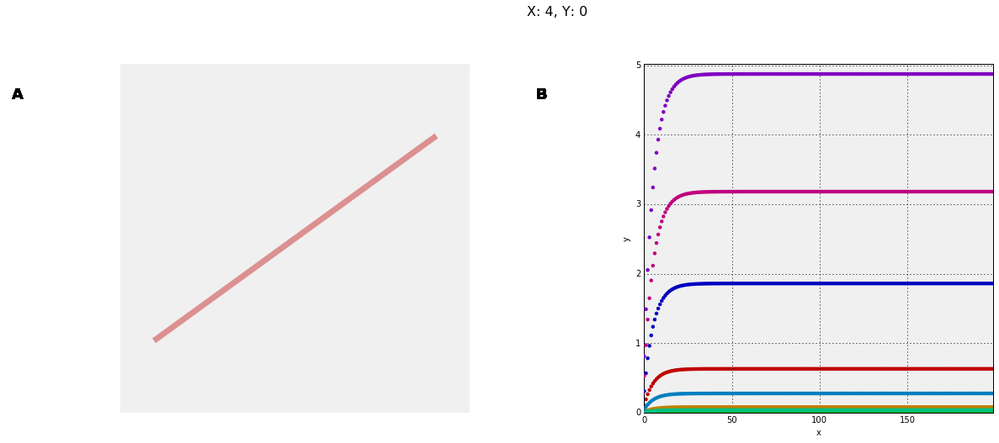
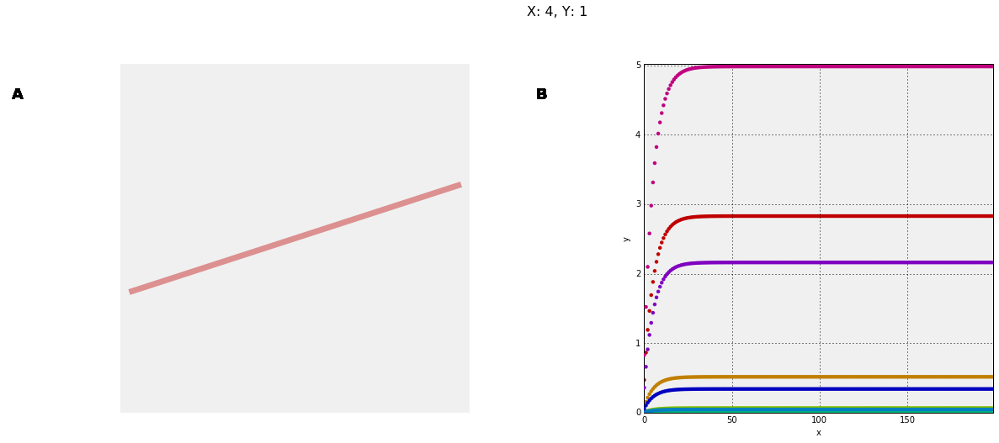

In [6]:
%%output size=200
%output holomap='auto'
%debug
m = 5
n = 2
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 200
# for vonMises function
k = 0.25
A = 3
# modulation
modul = 0
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
ac_orient = np.reshape(np.pi*np.arange(m*n)/(m*n), (m,n))
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes = vonMises(A,k,ac_orient,orientations)
r = np.zeros(spikes.shape)
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))

for i in range(len(t)):
    r = r + drdt
    r_pad = np.lib.pad(r, 1, padwithzeros)
    r_pad = r_pad[1:,:,:]
    r_pad = r_pad[-r_pad.shape[0]+1:,:,:]
    near_r = r_pad[:,0:m,0:n] + r_pad[:,1:m+1,0:n] + r_pad[:,2:m+2,0:n] + r_pad[:,0:m,1:n+1] 
    + r_pad[:,2:m+2,1:n+1] + r_pad[:,0:m,2:n+2] + r_pad[:,1:m+1,2:n+2] + r_pad[:,2:m+2,2:n+2]
    drdt = (-r + spikes)/tau + modul*near_r
    rs[:,:,:,i] = r

#r_first_neuron = rs[:,1,1,:]
dimensions = ['X', 'Y']
keys = [(i,j) for i in range(m) for j in range(n)]
r_first_neuron_hm = [(k, plotOneField(k,t,nosn,rs)) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
vf = visualField(ac_orient)
vf_holomap = hv.HoloMap([(k, visualField(ac_orient[k])) for k in keys], kdims=dimensions)
vf_holomap+sections

For 0 degree orientation it looks like we have less activity. In reality we have the same activity, the plot just overlaps.

In [3]:
rs[:,0,0,150]

array([ 5.02138423,  2.48889533,  0.42090428,  0.05578254,  0.01491523,
        0.01491523,  0.05578254,  0.42090428,  2.48889533])

:Overlay
   .Curve.I    :Curve   [x]   (y)
   .Curve.II   :Curve   [x]   (y)
   .Curve.III  :Curve   [x]   (y)
   .Curve.IV   :Curve   [x]   (y)
   .Curve.V    :Curve   [x]   (y)
   .Curve.VI   :Curve   [x]   (y)
   .Curve.VII  :Curve   [x]   (y)
   .Curve.VIII :Curve   [x]   (y)
   .Curve.IX   :Curve   [x]   (y)
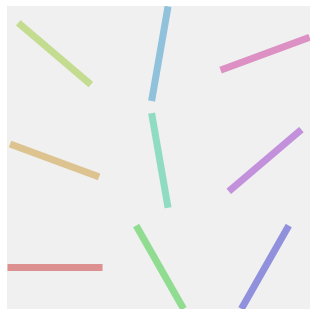

In [4]:
%%output size=150
visualField2(orientations.reshape(3,3))

:Layout
   .HoloMap.I   :HoloMap   [Angle]
      :Curve   [x]   (y)
   .HoloMap.II  :HoloMap   [Angle]
      :Overlay
         .Points.I    :Points   [x,y]
         .Points.II   :Points   [x,y]
         .Points.III  :Points   [x,y]
         .Points.IV   :Points   [x,y]
         .Points.V    :Points   [x,y]
         .Points.VI   :Points   [x,y]
         .Points.VII  :Points   [x,y]
         .Points.VIII :Points   [x,y]
         .Points.IX   :Points   [x,y]
   .HoloMap.III :HoloMap   [Angle]
      :RGB   [x,y]   (R,G,B,A)
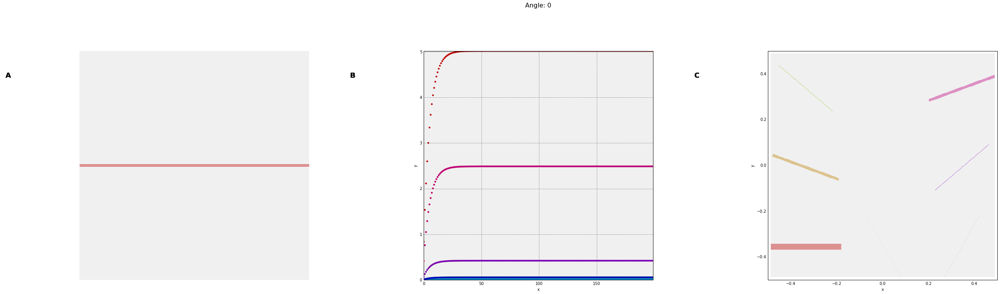
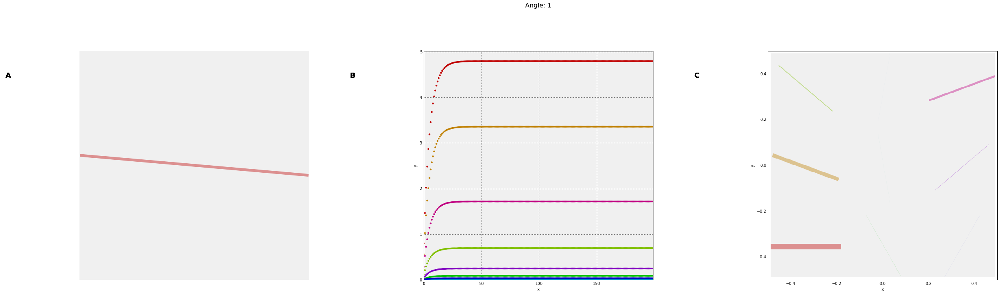
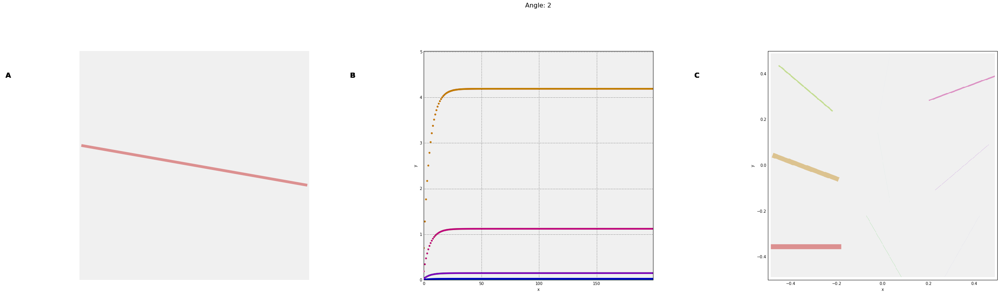
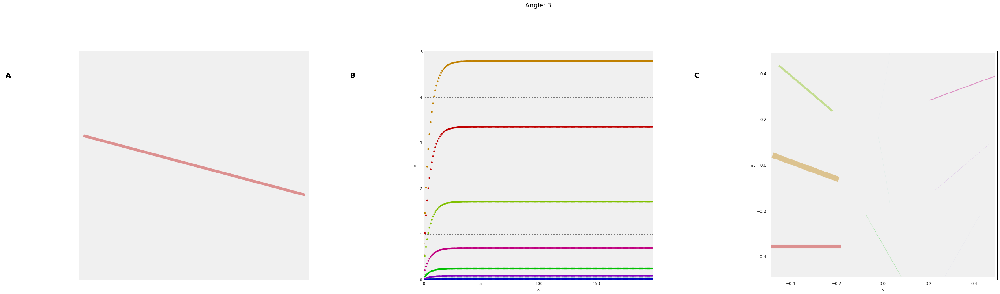
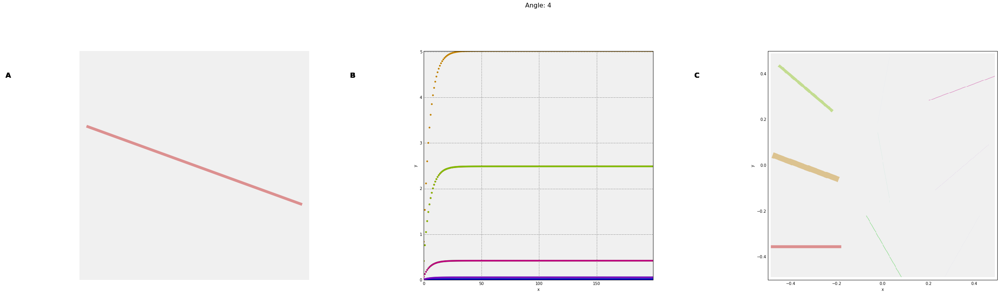
...
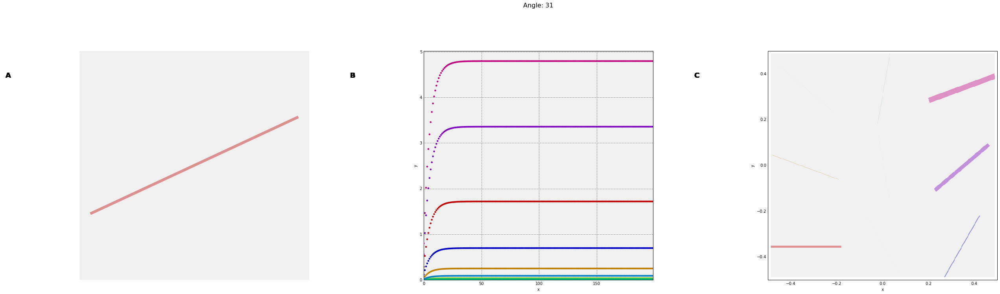
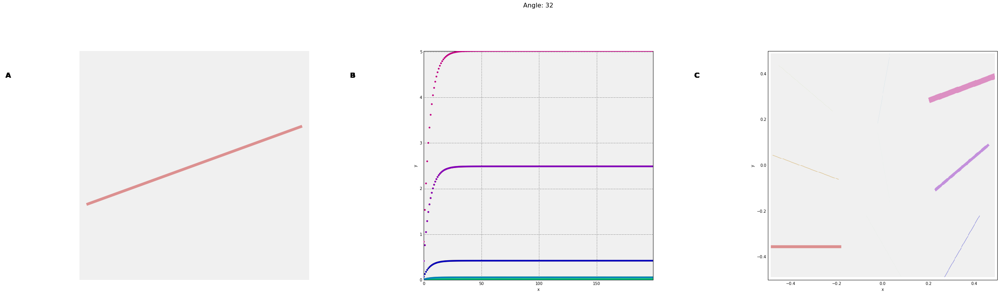
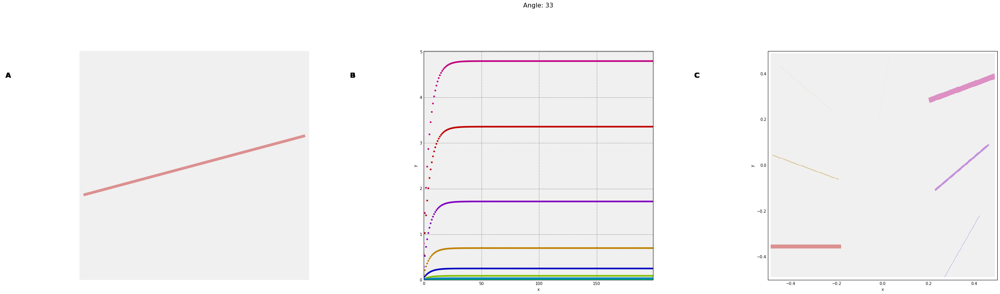
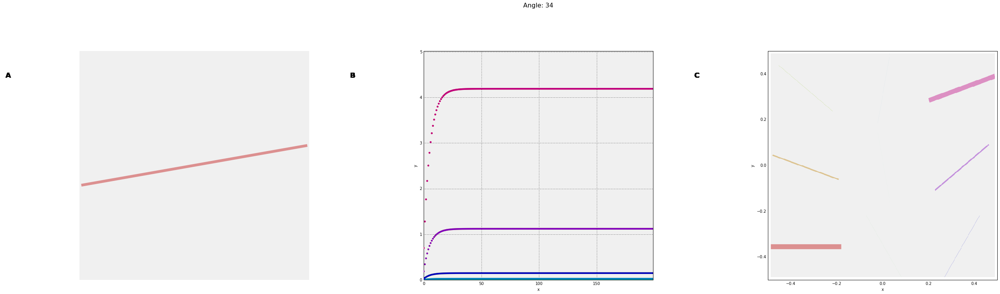
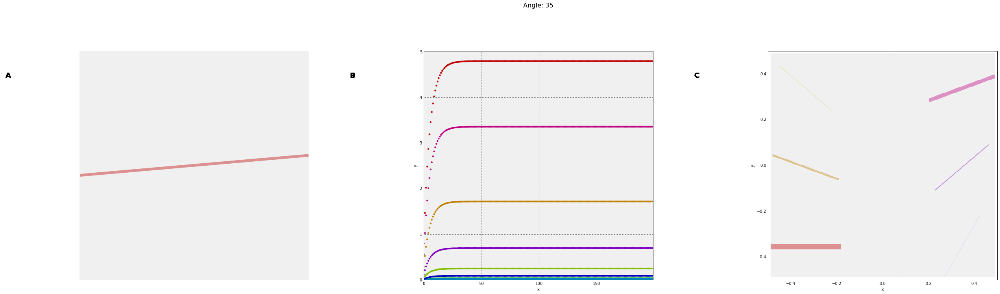

In [4]:
%%output size=300
#%%output size=300 filename="test"

#%output holomap='gif'
m = 6
n = 6
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 200
# for vonMises function
k = 0.25
A = 3
# modulation
modul = 0
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
ac_orient = np.reshape(np.pi*np.arange(m*n)/(m*n), (m,n))
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes = vonMises(A,k,ac_orient,orientations)
r = np.zeros(spikes.shape)
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))

for i in range(len(t)):
    r = r + drdt
    r_pad = np.lib.pad(r, 1, padwithzeros)
    r_pad = r_pad[1:,:,:]
    r_pad = r_pad[-r_pad.shape[0]+1:,:,:]
    near_r = r_pad[:,0:m,0:n] + r_pad[:,1:m+1,0:n] + r_pad[:,2:m+2,0:n] + r_pad[:,0:m,1:n+1] 
    + r_pad[:,2:m+2,1:n+1] + r_pad[:,0:m,2:n+2] + r_pad[:,1:m+1,2:n+2] + r_pad[:,2:m+2,2:n+2]
    drdt = (-r + spikes)/tau + modul*near_r
    rs[:,:,:,i] = r

#r_first_neuron = rs[:,1,1,:]
dimensions = ['Angle']
keys = [i for i in range(m*n)]
setNumberOfColors(nosn)
r_first_neuron_hm = [(k, plotOneField((k/m,k%m),t,nosn,rs)) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
setNumberOfColors(nosn)
r_first_neuron_hm = [(k, plotOneField2(orientations, (k/m,k%m),t,nosn,rs)) for k in keys]
sections2 = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
#vf = visualField(ac_orient)
vf_holomap = hv.HoloMap([(k, visualField(ac_orient[(k/m,k%m)])) for k in keys], kdims=dimensions)
vf_holomap+sections+sections2

In [20]:
ac_orient[0]

array([ 0.        ,  0.08726646,  0.17453293,  0.26179939,  0.34906585,
        0.43633231])

<IPython.core.display.Javascript object>


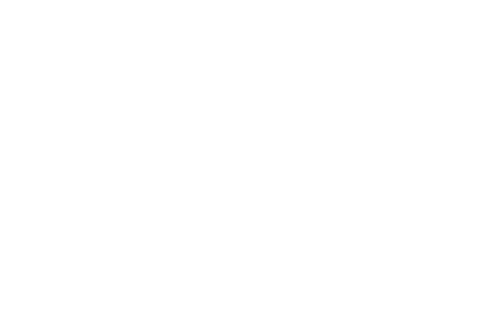

:Layout
   .HoloMap.I   :HoloMap   [Angle]
      :Curve   [x]   (y)
   .HoloMap.II  :HoloMap   [Angle]
      :Overlay
         .Points.I    :Points   [x,y]
         .Points.II   :Points   [x,y]
         .Points.III  :Points   [x,y]
         .Points.IV   :Points   [x,y]
         .Points.V    :Points   [x,y]
         .Points.VI   :Points   [x,y]
         .Points.VII  :Points   [x,y]
         .Points.VIII :Points   [x,y]
         .Points.IX   :Points   [x,y]
   .HoloMap.III :HoloMap   [Angle]
      :RGB   [x,y]   (R,G,B,A)
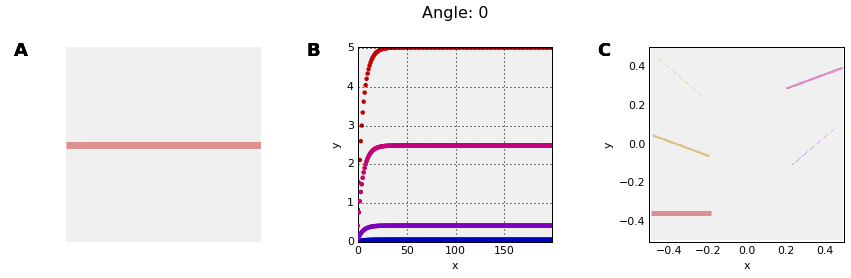
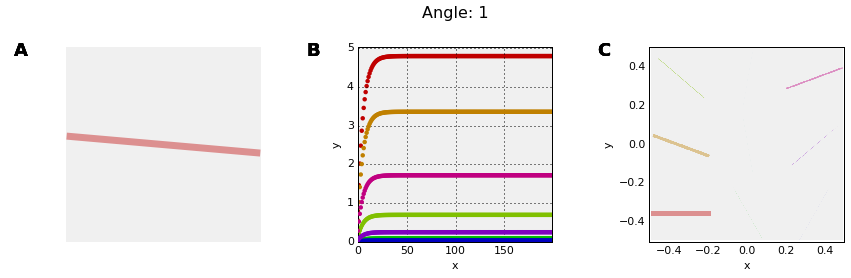
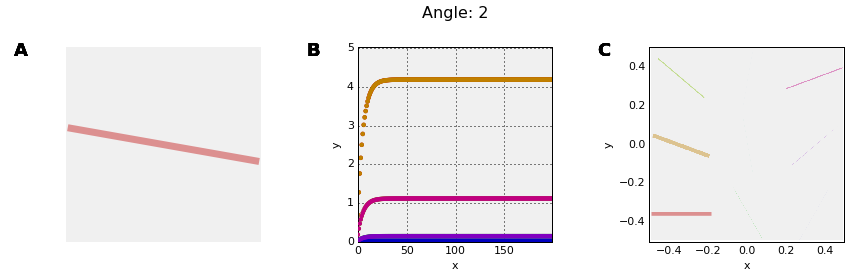
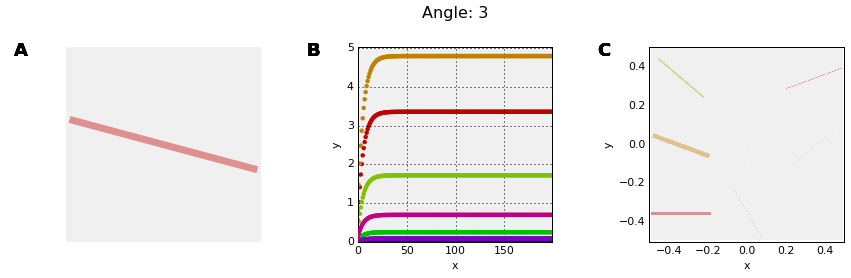
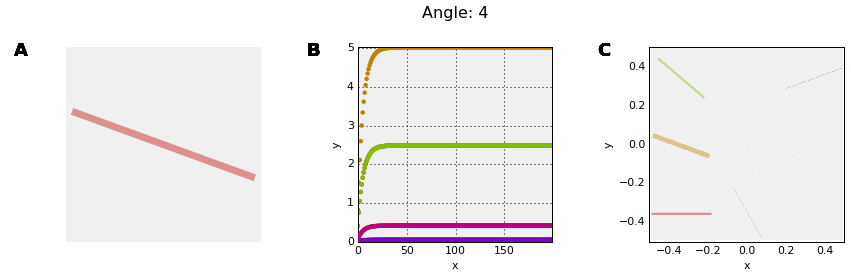
...
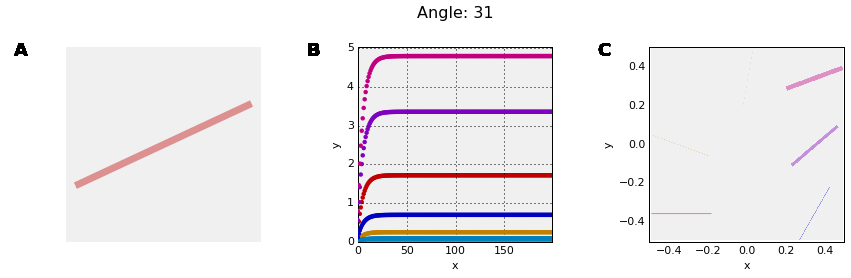
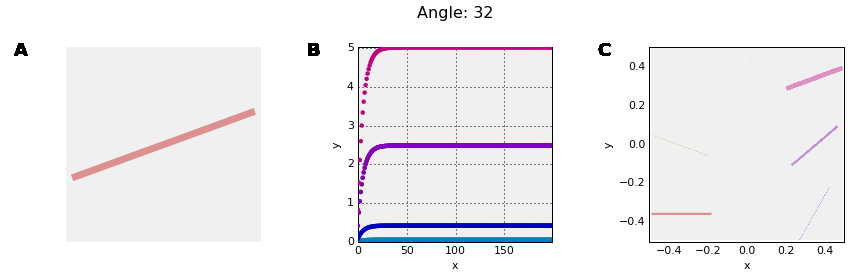
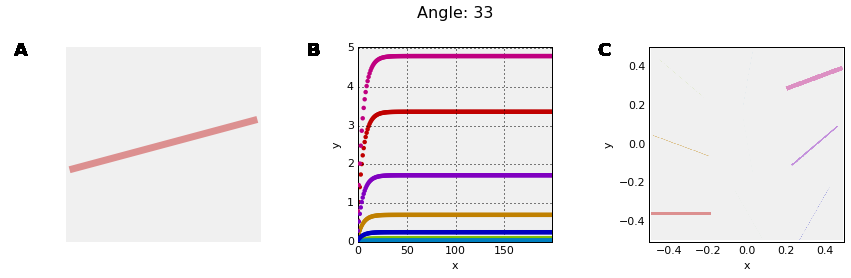
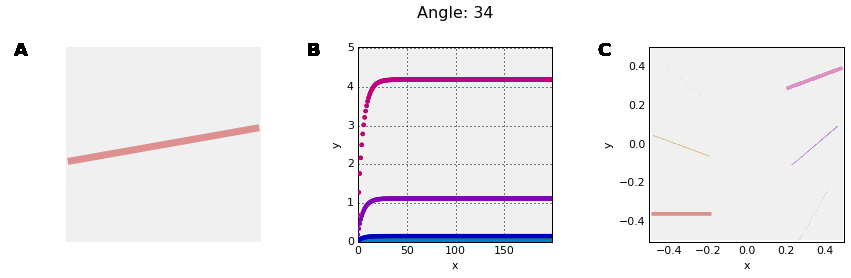
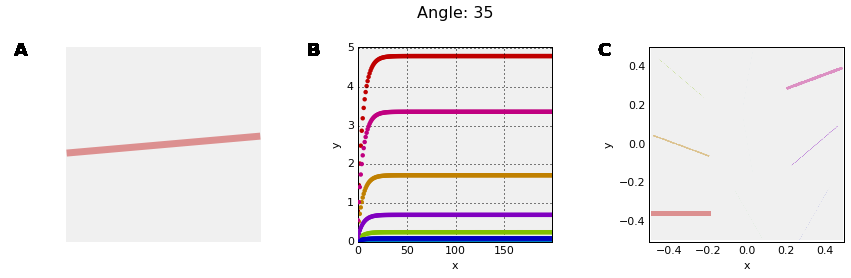

In [18]:
vf_holomap+sections+sections2

In [3]:
%%output size=300

%output holomap='gif'
m = 6
n = 6
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 3
# for vonMises function
k = 0.25
A = 3
# modulation
modul = 0
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
ac_orient = np.reshape(np.pi*np.arange(m*n)/(m*n), (m,n))
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes = vonMises(A,k,ac_orient,orientations)
r = np.zeros(spikes.shape)
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))

for i in range(len(t)):
    r = r + drdt
    r_pad = np.lib.pad(r, 1, padwithzeros)
    r_pad = r_pad[1:,:,:]
    r_pad = r_pad[-r_pad.shape[0]+1:,:,:]
    near_r = r_pad[:,0:m,0:n] + r_pad[:,1:m+1,0:n] + r_pad[:,2:m+2,0:n] + r_pad[:,0:m,1:n+1] 
    + r_pad[:,2:m+2,1:n+1] + r_pad[:,0:m,2:n+2] + r_pad[:,1:m+1,2:n+2] + r_pad[:,2:m+2,2:n+2]
    drdt = (-r + spikes)/tau + modul*near_r
    rs[:,:,:,i] = r

#r_first_neuron = rs[:,1,1,:]
dimensions = ['Angle']
keys = [i for i in range(m*n)]
r_first_neuron_hm = [(k, plotOneField2(orientations, (k/m,k%m),t,nosn,rs)) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
vf = visualField(ac_orient)
vf_holomap = hv.HoloMap([(k, visualField(ac_orient[(k/m,k%m)])) for k in keys], kdims=dimensions)
vf_holomap+sections

NameError: global name 'visualField3' is not defined

:HoloMap   [Angle]
   :RGB   [x,y]   (R,G,B,A)
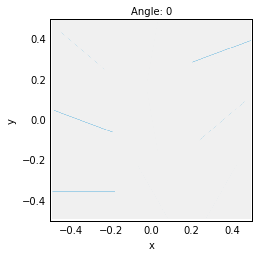
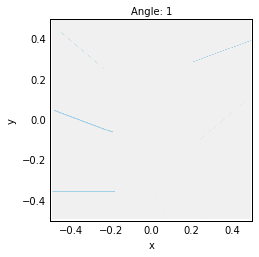
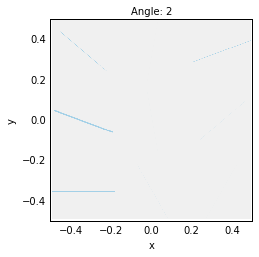
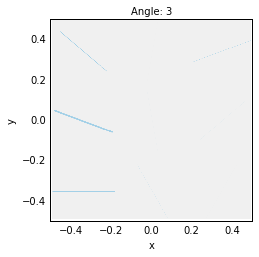
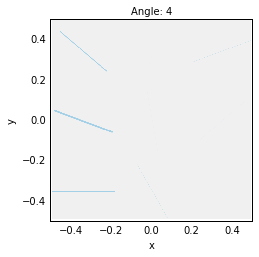
...
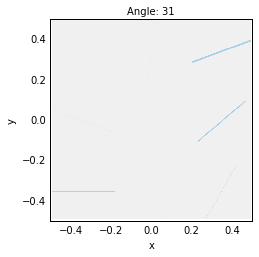
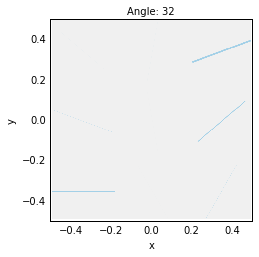
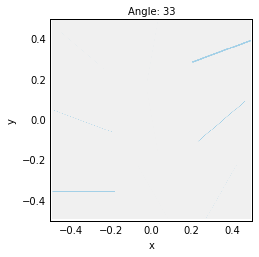
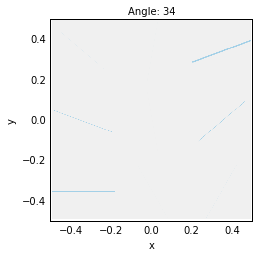
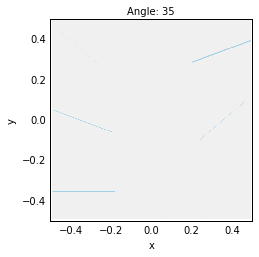

In [6]:
sections

:Overlay
   .Curve.I    :Curve   [x]   (y)
   .Curve.II   :Curve   [x]   (y)
   .Curve.III  :Curve   [x]   (y)
   .Curve.IV   :Curve   [x]   (y)
   .Curve.V    :Curve   [x]   (y)
   .Curve.VI   :Curve   [x]   (y)
   .Curve.VII  :Curve   [x]   (y)
   .Curve.VIII :Curve   [x]   (y)
   .Curve.IX   :Curve   [x]   (y)
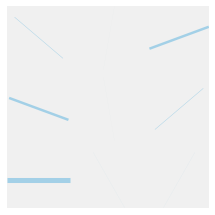

In [7]:
r_first_neuron_hm[0][1]

[ 0.01860415  0.01302718  0.03634651  0.25        1.71956004  4.79766287
  3.35946539  0.69751314  0.08960405]


:Overlay
   .Curve.I    :Curve   [x]   (y)
   .Curve.II   :Curve   [x]   (y)
   .Curve.III  :Curve   [x]   (y)
   .Curve.IV   :Curve   [x]   (y)
   .Curve.V    :Curve   [x]   (y)
   .Curve.VI   :Curve   [x]   (y)
   .Curve.VII  :Curve   [x]   (y)
   .Curve.VIII :Curve   [x]   (y)
   .Curve.IX   :Curve   [x]   (y)
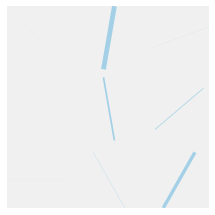

In [6]:
plotOneField2(orientations, (3,3),t,nosn,rs)

In [79]:
ac_orient

array([[ 0.        ,  0.08726646,  0.17453293,  0.26179939,  0.34906585,
         0.43633231],
       [ 0.52359878,  0.61086524,  0.6981317 ,  0.78539816,  0.87266463,
         0.95993109],
       [ 1.04719755,  1.13446401,  1.22173048,  1.30899694,  1.3962634 ,
         1.48352986],
       [ 1.57079633,  1.65806279,  1.74532925,  1.83259571,  1.91986218,
         2.00712864],
       [ 2.0943951 ,  2.18166156,  2.26892803,  2.35619449,  2.44346095,
         2.53072742],
       [ 2.61799388,  2.70526034,  2.7925268 ,  2.87979327,  2.96705973,
         3.05432619]])

:Curve   [x]   (y)
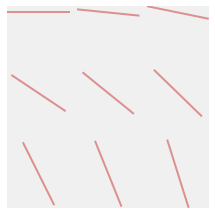

In [82]:
visualField(ac_orient[0:3,0:3])

In [101]:
rs.shape

(9, 6, 6, 200)

In [ ]:
%%output holomap="gif" filename="test"
vf_holomap+sections

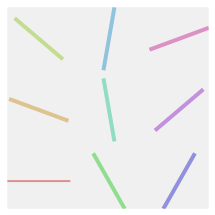

In [49]:
visualField2(orientations.reshape(3,3))

In [103]:
len(orientations)

9

0.785398163397


:Curve   [x]   (y)
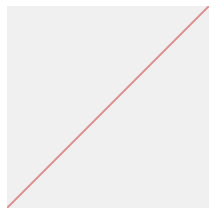

In [238]:
visualField(np.array(np.pi/4))

[ 1.57079633  3.14159265  2.35619449  3.92699082]


:Curve   [x]   (y)
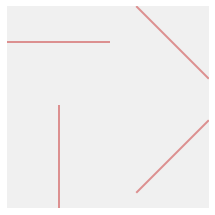

In [240]:
visualField(ac_orient)

3.14159265359


:Curve   [x]   (y)
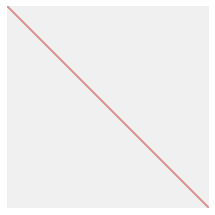

In [221]:
visualField(ac_orient[1,0])

In [241]:
ac_orient

array([[ 0.        ,  0.78539816],
       [ 1.57079633,  2.35619449]])

In [15]:
def plotbar(x,y,th,color='k',width=2,l=1):
    ''' 
    Plot a single bar 
    x,y: location middle of bar
    th(eta): orientation
    color: color (default = black)
    width: linewidth (default = 2)
    l:     line length (default = 1)
    Returns a holoviews curve object
    '''
    th = np.asarray(th)
    th = th + np.pi/2 # so that the orientation is relative to the vertical
    print(th)
    hl = l/2 # half length bar
    
    # define x and y points of bar
    X = [x-pl.sin(th)*hl,x+pl.sin(th)*hl]
    Y = [y-pl.cos(th)*hl,y+pl.cos(th)*hl]
    
    # return holoviews curve
    curve = hv.Curve(zip(X,Y))
    return curve(plot={'yaxis':None, 'xaxis':None})(style={'alpha':0.4, 'linewidth':width})    

In [25]:
(direction, magnitude) = populationVector(orientations, rs, nosn, timesteps)

In [472]:
magnitude[:,:,0]

array([[ 1.48282627,  1.48251386],
       [ 1.48220139,  1.48251386]])

In [471]:
direction[:,:,0]

array([[ 0.        ,  0.78529771],
       [ 1.57079633,  2.35629494]])

In [431]:
a = list(ac_orient.shape)
a.append(1)
b = np.reshape(ac_orient,a)
c = np.repeat(b,200,axis=2)
c.shape


(5, 5, 200)

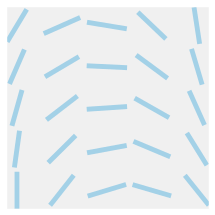

In [459]:
visualField3(direction[:,:,1], magnitude[:,:,1])

In [466]:
np.arange(m*n)

array([0, 1, 2, 3])

Full connectivity

:HoloMap   [T]
   :RGB   [x,y]   (R,G,B,A)
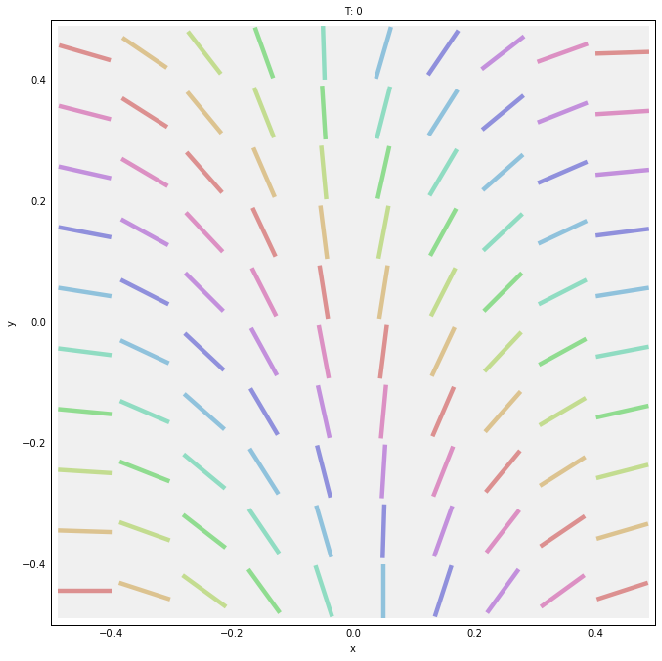
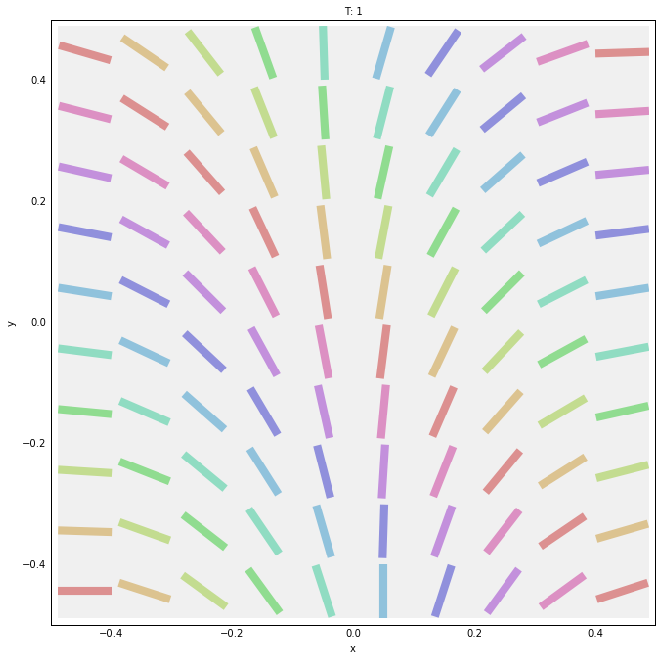
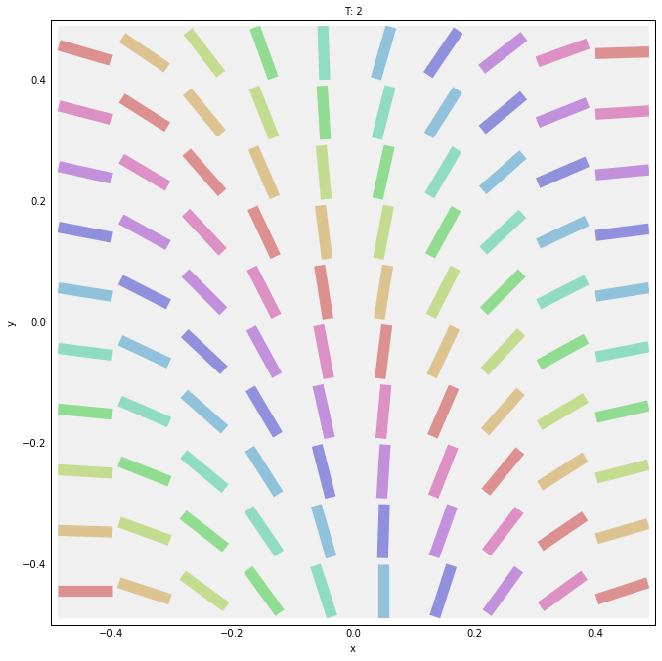
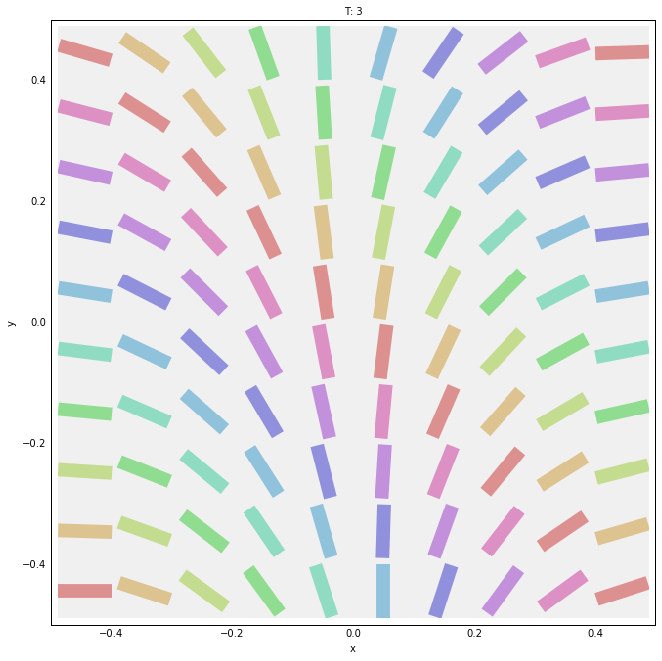
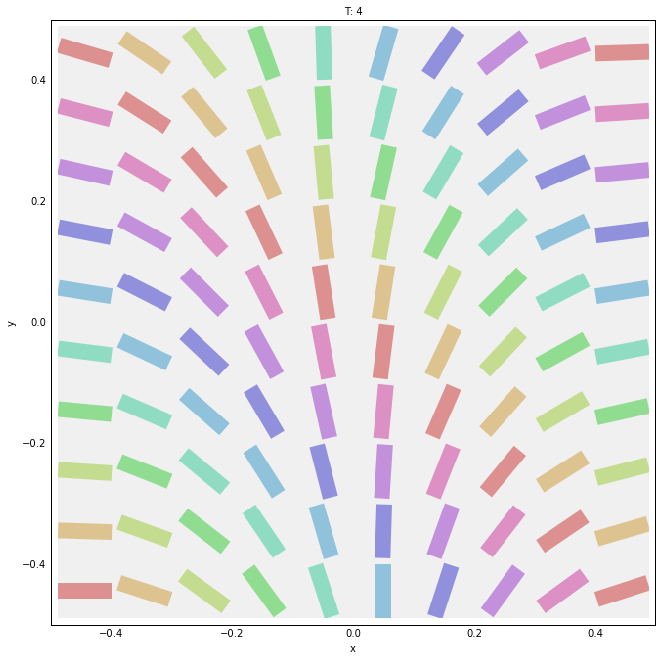
...
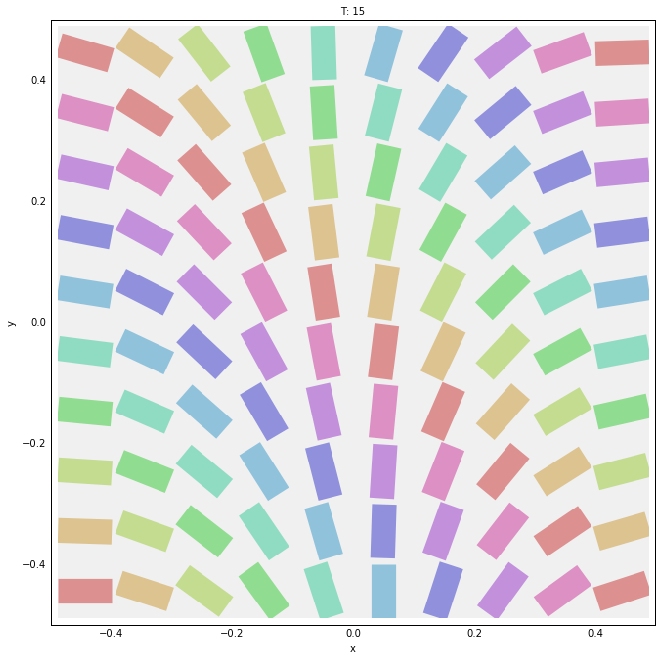
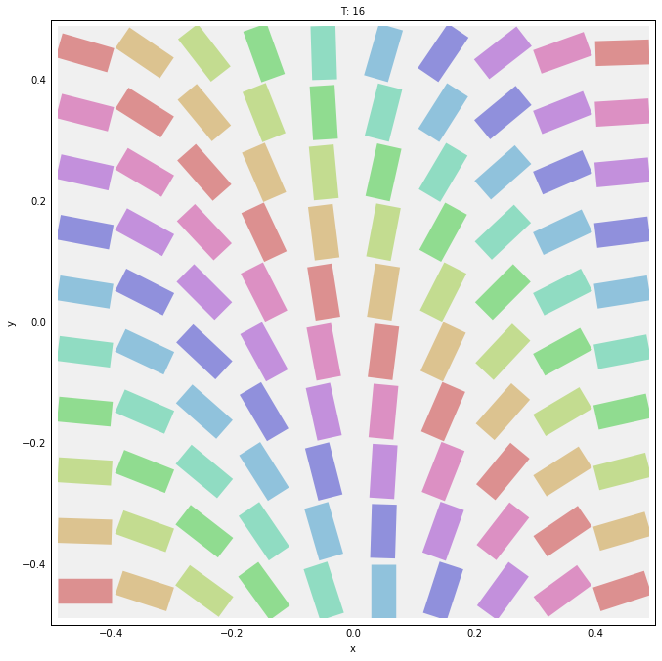
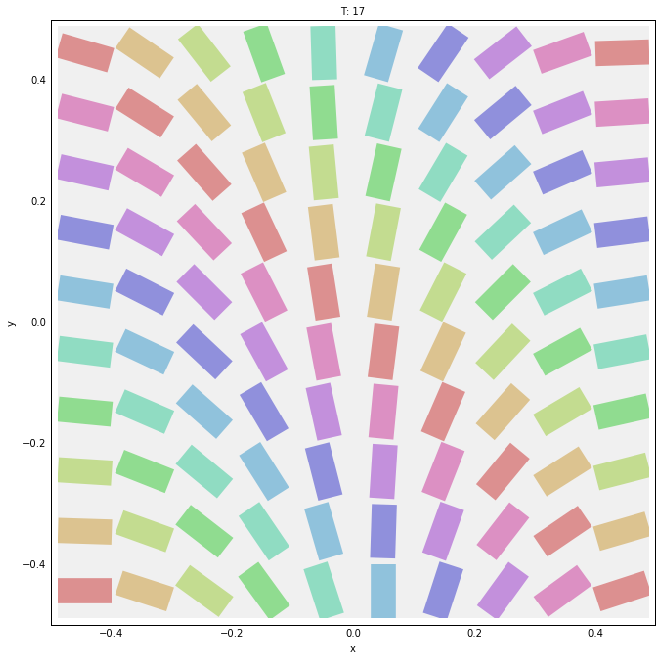
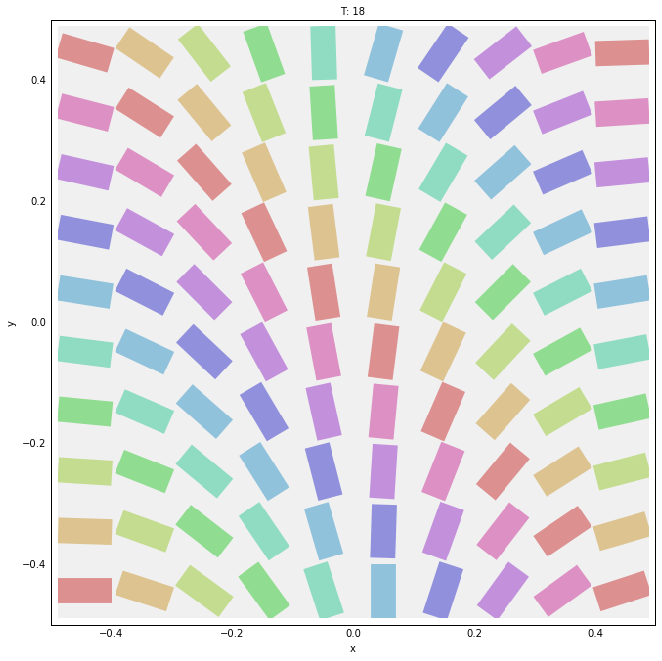
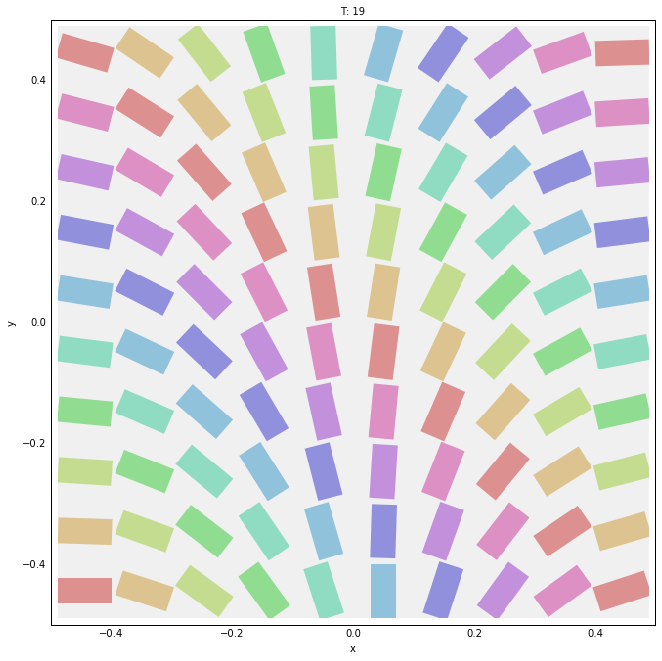

In [4]:
%%output size=300
m = 10
n = 10
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 20
# for vonMises function
k = 0.25
A = 3
# for the weight matrix
distance_scaling = 0.00005
orientation_scaling = 0.00005
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
ac_orient = np.reshape(np.pi*np.arange(m*n)/(m*n), (m,n))
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes_ = vonMises(A,k,ac_orient,orientations)
spikes = spikes_.ravel()
r = np.zeros(len(spikes))
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))
#matrix = np.load(matrix_file)
#matrix_file.seek(0)
#matrix
matrix = covarianceMatrix(np.ones((m,n,nosn)), distance_scaling, orientation_scaling)
for s in range(len(t)):
    r = r + drdt
    drdt = (-r + spikes)/tau + np.dot(matrix,r)
    rs[:,s] = r

#r_first_neuron = rs[:,1,1,:]
rs = np.reshape(rs, spikes_.shape + (len(t),))
(direction, magnitude) = populationVector(orientations, rs, nosn, timesteps)
dimensions = ['T']
keys = [i for i in range(timesteps)]
r_first_neuron_hm = [(k, visualFieldMagnitude(direction[:,:,k],magnitude[:,:,k])) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
sections

:HoloMap   [T]
   :RGB   [x,y]   (R,G,B,A)
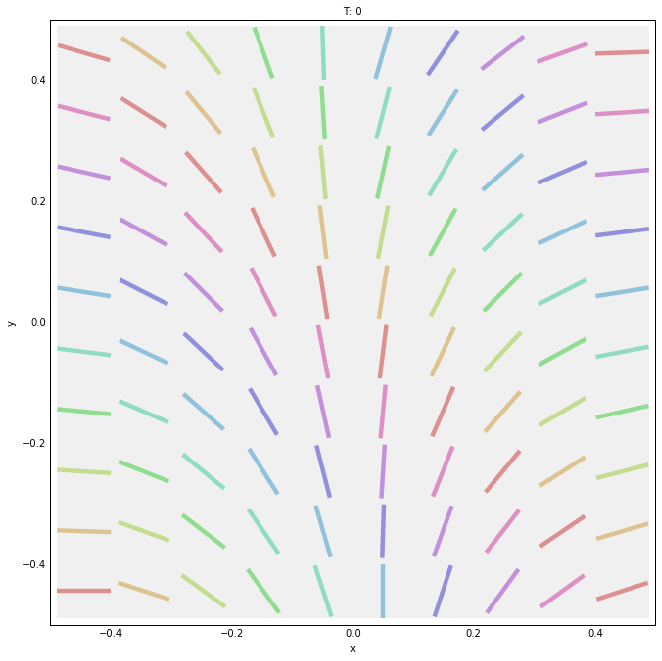
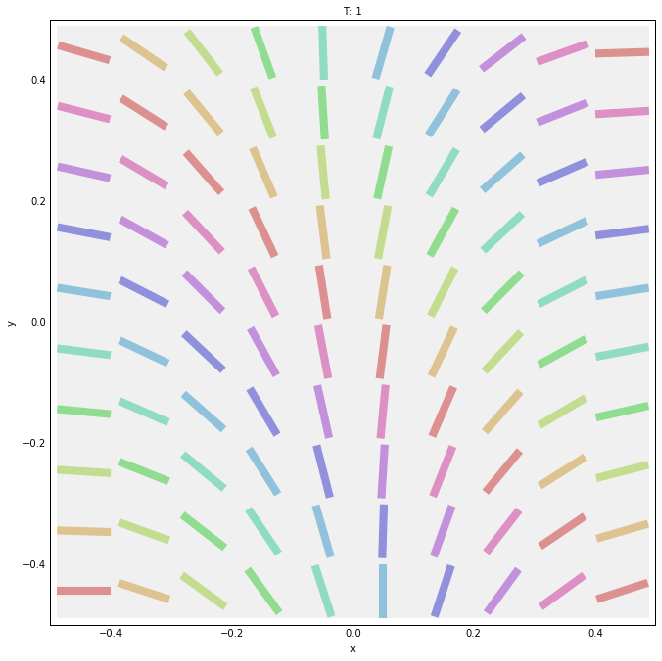
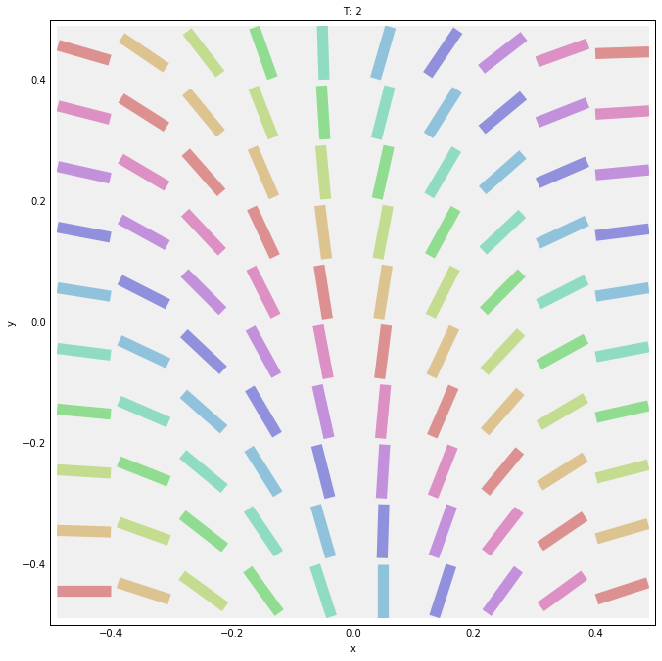
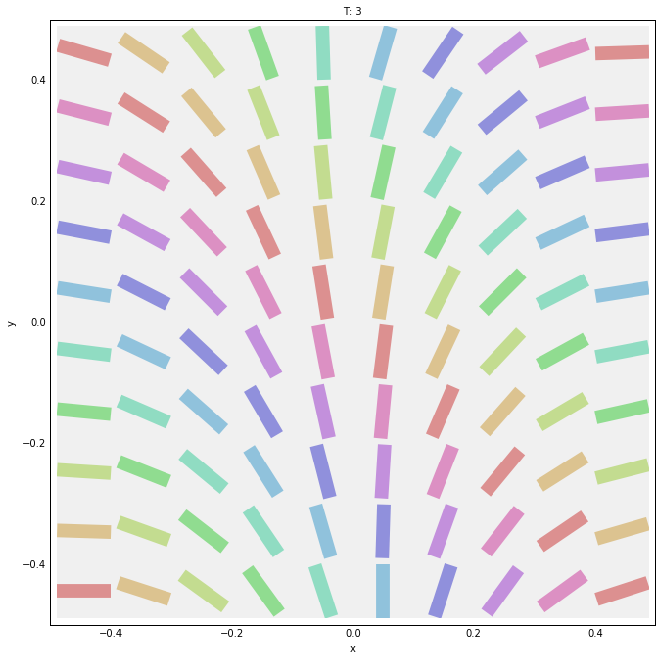
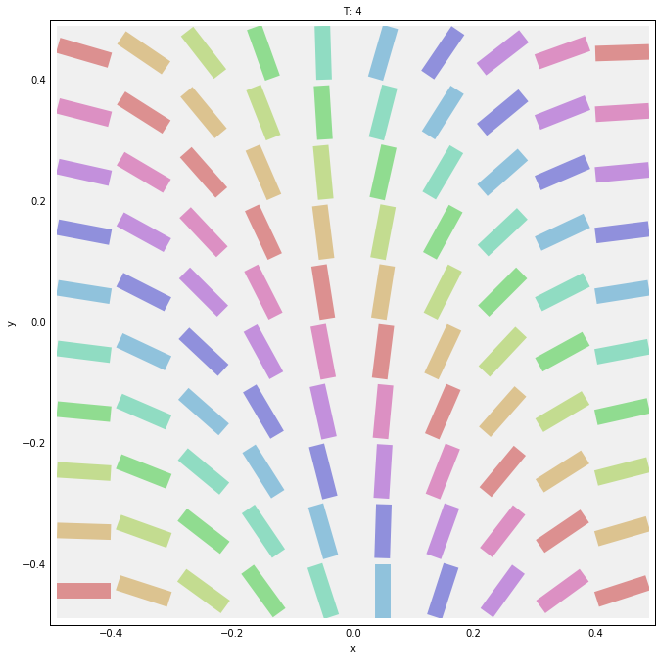
...
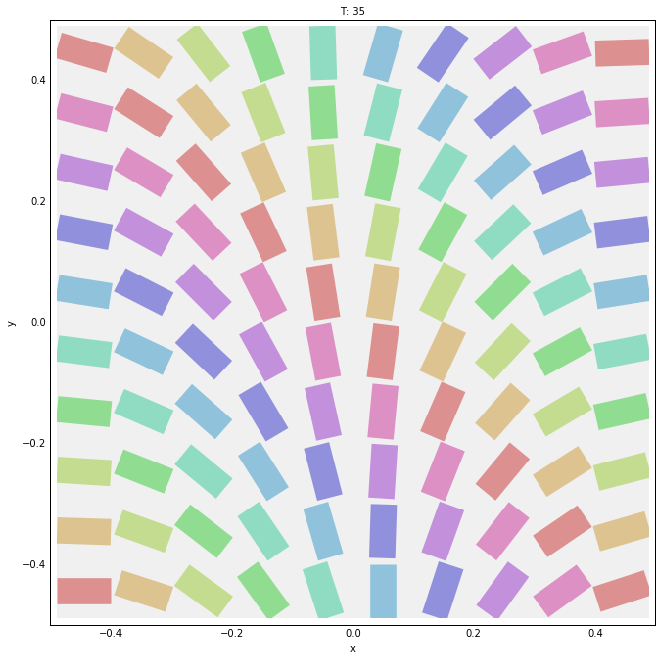
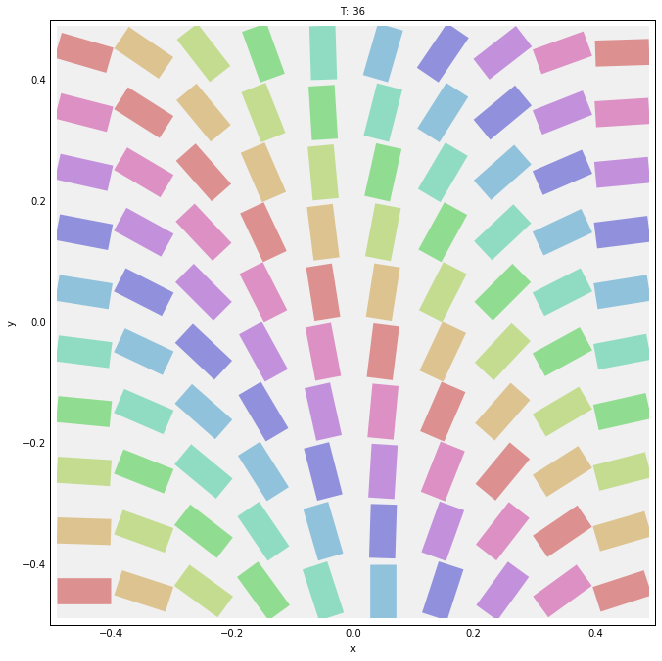
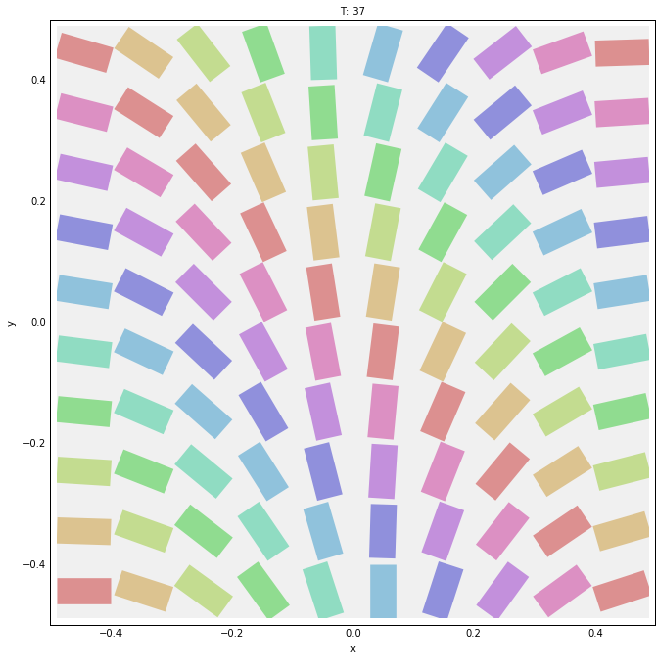
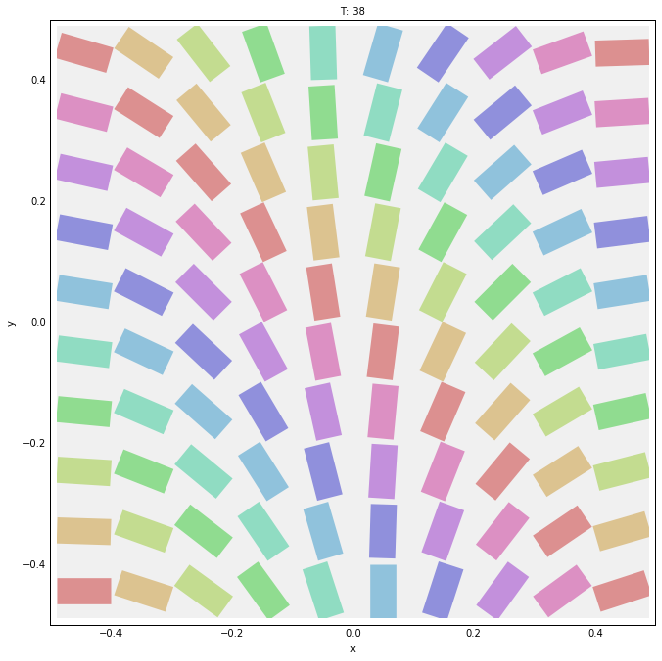
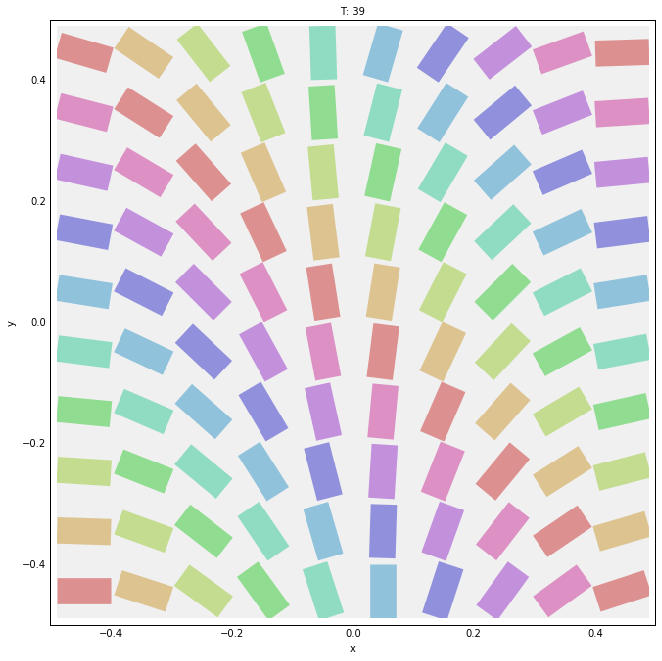

In [4]:
%%output size=300
m = 10
n = 10
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 40
# for vonMises function
k = 0.25
A = 3
# for the weight matrix
distance_scaling = 0.00005
orientation_scaling = 0.00005
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
ac_orient = np.reshape(np.pi*np.arange(m*n)/(m*n), (m,n))
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes_ = vonMises(A,k,ac_orient,orientations)
spikes = spikes_.ravel()
r = np.zeros(len(spikes))
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))
#matrix = np.load(matrix_file)
#matrix_file.seek(0)
#matrix
matrix = covarianceMatrix(np.ones((m,n,nosn)), distance_scaling, orientation_scaling)
for s in range(len(t)):
    r = r + drdt
    drdt = (-r + spikes)/tau + np.dot(matrix,r)
    rs[:,s] = r

#r_first_neuron = rs[:,1,1,:]
rs = np.reshape(rs, spikes_.shape + (len(t),))
(direction, magnitude) = populationVector(orientations, rs, nosn, timesteps)
dimensions = ['T']
keys = [i for i in range(timesteps)]
r_first_neuron_hm = [(k, visualField3(direction[:,:,k],magnitude[:,:,k])) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
sections

In [16]:
def plotbar(x,y,th,color='k',width=2,l=1):
    ''' 
    Plot a single bar 
    x,y: location middle of bar
    th(eta): orientation
    color: color (default = black)
    width: linewidth (default = 2)
    l:     line length (default = 1)
    Returns a holoviews curve object
    '''
    th = np.asarray(th)
    th = th + np.pi/2 # so that the orientation is relative to the vertical
    hl = l/2 # half length bar
    
    # define x and y points of bar
    X = [x-pl.sin(th)*hl,x+pl.sin(th)*hl]
    Y = [y-pl.cos(th)*hl,y+pl.cos(th)*hl]
    
    # return holoviews curve
    curve = hv.Curve(zip(X,Y))
    return curve(plot={'yaxis':None, 'xaxis':None})(style={'alpha':0.4, 'linewidth':width})   

In [2]:
import elastica as el
import elastica_neurons as en
import inspect
import numpy as np

nosn = 9
orientations = np.arange(0, np.pi, np.pi/nosn)

orientations2 = np.expand_dims(orientations, axis=1)
orientations3 = np.expand_dims(orientations2, axis=2)
orientations4 = np.tile(orientations3, (1, 10, 10))
orientations4.shape
vector_length = np.size(orientations4.ravel())
matrix = np.zeros((vector_length, vector_length))
unrolled_vector = orientations4.ravel()
for i in range(vector_length):
        for j in range(vector_length):
            i_coord = calculateCoordinatesZ(i, orientations4.shape)
            j_coord = calculateCoordinatesZ(j, orientations4.shape)
            x = i_coord[1]-j_coord[1]
            y = i_coord[2]-j_coord[2]
            theta1 = orientations4[i_coord[0],i_coord[1],i_coord[2]]
            theta2 = orientations4[j_coord[0],j_coord[1],j_coord[2]]
            energy = en.E(theta1,theta2,[x,y])
            matrix[i,j] = energy
            matrix[j,i] = energy
            
            
            
#en.E(np.pi,np.pi,[0,1])



-c:22: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:23: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


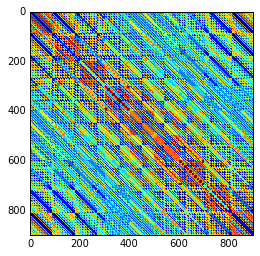

In [23]:
plt.imshow(matrix)
matrix = matrix * 2

In [6]:
unrolled_vector[154]


0.3490658503988659

In [42]:
orientations4[i_coord[0],i_coord[1],i_coord[2]]

-c:1: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


0.0

In [37]:
en.E(np.pi,np.pi,[0,0])

array([  7.19884696e-31])

In [1]:
m = 10
n = 10
nosn = 9
distance_scaling = 0.00005
orientation_scaling = 0.00005
np.size(np.ones((m,n,nosn)))
a = covarianceMatrix(np.ones((m,n,nosn)),distance_scaling,orientation_scaling)
a.shape
plt.imshow(a)


NameError: name 'np' is not defined

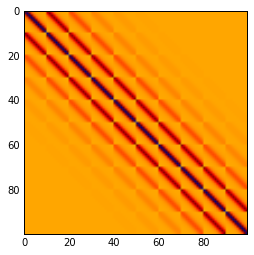

In [34]:
plt.imshow(a[0:100,0:100])

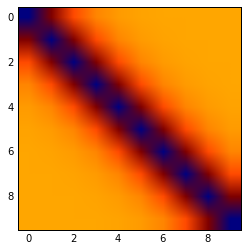

In [548]:
imshow(a[0:10,0:10])


In [3]:
from tempfile import TemporaryFile
matrix_file = TemporaryFile()
np.save(matrix_file, matrix)
matrix_file.seek(0)

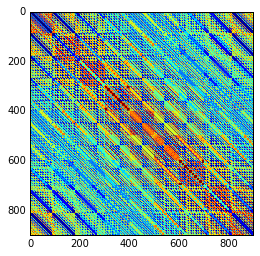

In [4]:
matrix = np.load(matrix_file)
matrix_file.seek(0)
plt.imshow(matrix)

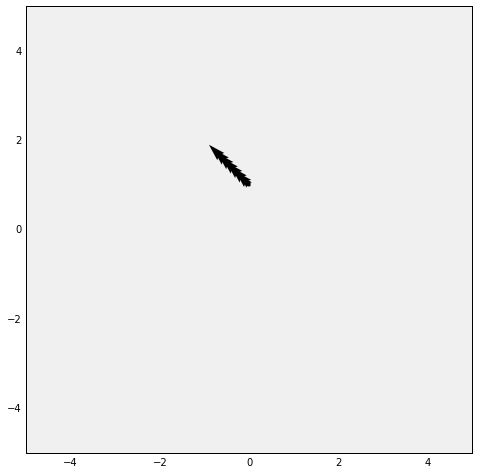

In [13]:
import numpy
import pylab

# Regular grid coordineates, velocity field and stream function
#x, y = numpy.meshgrid(numpy.arange(0, 21), numpy.arange(0, 11))
size = 10
u = -numpy.arange(size)
x = numpy.zeros(size)
y = numpy.ones(size)
v = numpy.arange(size)

# The plots!
#pylab.close('all')
#pylab.ion()
a = pylab.figure(figsize=[8, 8])
#pylab.contour(x, y, psi, 20, colors='k', linestyles='-', linewidth=1.0)
a = pylab.quiver(x,y,u, v, angles='uv', scale_units='xy', scale=10)
b = pylab.ylim([-5,5])
b = pylab.xlim([-5,5])
#ax = pylab.axes()
#ax.set_aspect(1.)

In [15]:
a

In [1]:
single_direction = direction[0,0,2]
single_magnitude = magnitude[0,0,2]
neurons = rs[:,0,0,2]
sin_o = np.sin(orientations)
cos_o = np.cos(orientations)
x = numpy.ones(9)
pylab.quiver(x,x,np.multiply(sin_o,neurons), np.multiply(cos_o,neurons), angles='uv', scale_units='xy', scale=10)
pylab.ylim([0.85,1.3])
pylab.xlim([0.85,1.1])

NameError: name 'direction' is not defined

In [111]:
orientations = np.arange(0, np.pi, np.pi/nosn)
r = np.array([0.9,0,0.9,0,0,0,0,0,0.9])
orientations = 2 * orientations
sin_o = np.sin(orientations)
cos_o = np.cos(orientations)
r_x = np.dot(sin_o, r)
r_y = np.dot(cos_o, r)
magnitude = np.sqrt(np.power(r_x,2) + np.power(r_y,2))
r_x = np.divide(r_x, magnitude)
r_y = np.divide(r_y, magnitude)
direction = (np.arcsin(r_x)>0)*np.arccos(r_y) + (np.arcsin(r_x)<0)*(2*np.pi-np.arccos(r_y))
direction = direction.real/2

(0.85, 1.3)

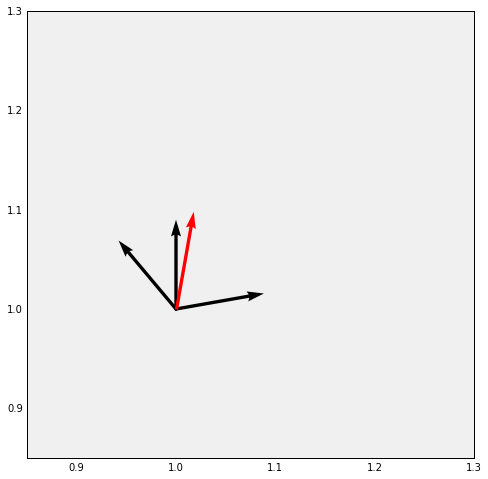

In [112]:
neurons = r
sin_o = np.sin(orientations)
cos_o = np.cos(orientations)
x = numpy.ones(9)
pylab.figure(figsize=[8, 8])

pylab.quiver(x,x,np.multiply(sin_o,neurons), np.multiply(cos_o,neurons), angles='uv', scale_units='xy', scale=10)
pylab.quiver(1,1,r_x, r_y, angles='uv', scale_units='xy', color='r', scale=10)

pylab.ylim([0.85,1.3])
pylab.xlim([0.85,1.3])


In [2]:
import pylab
import numpy

def populationVisualization(r):
    plt.ioff()
    nosn = 4
    orientations = np.arange(0, np.pi, np.pi/4)
    orientations = 2 * orientations
    sin_o = np.sin(orientations)
    cos_o = np.cos(orientations)
    r_x = np.dot(sin_o, r)
    r_y = np.dot(cos_o, r)
    x = numpy.ones(4)
    a = plt.figure(figsize=[8, 8])
    
    plt.quiver(x,x,np.multiply(sin_o,r), np.multiply(cos_o,r), angles='uv', scale_units='xy', scale=10)
    plt.quiver(1,1,r_x, r_y, angles='uv', scale_units='xy', color='r', scale=10)

    plt.ylim([0.85,1.3])
    plt.xlim([0.85,1.3])
    plt.savefig('example_I.png')
    parrot = RGB.load_image('example_I.png', array=True)
    rgb_parrot = RGB(parrot)
    del a
    return rgb_parrot


In [35]:
b = populationVisualization([0.9,0.1,0.3,0.2])

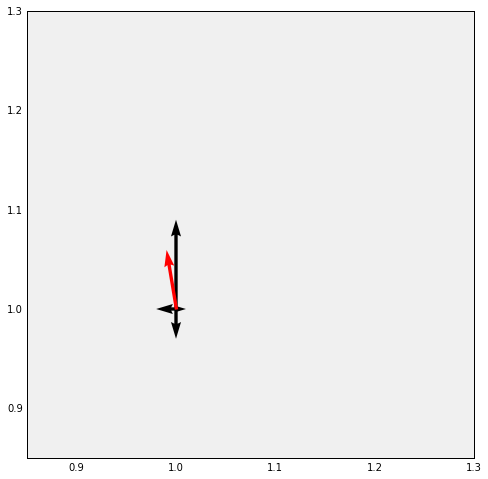

In [36]:
b

In [5]:
max_value = 1
diff = 0.25
magnitudes = [(x1,x2,x3,x4) for x1 in np.arange(0,max_value,diff)
             for x2 in np.arange(0,max_value,diff) for x3 in np.arange(0,max_value,diff)
             for x4 in np.arange(0,max_value,diff) ]
data = [(conf, populationVisualization(conf)) for conf in magnitudes]

/usr/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


:HoloMap   [x1,x2,x3,x4]
   :RGB   [x,y]   (R,G,B,A)
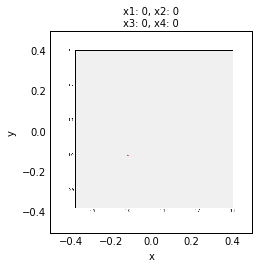
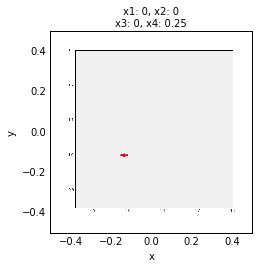
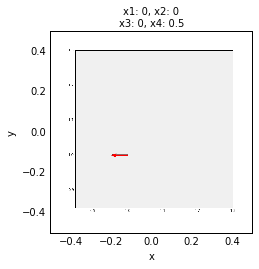
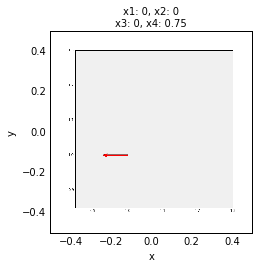
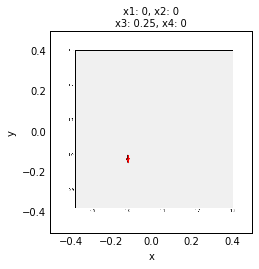
...
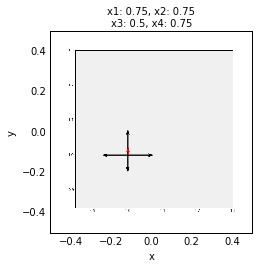
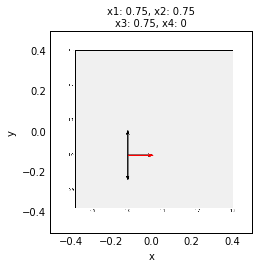
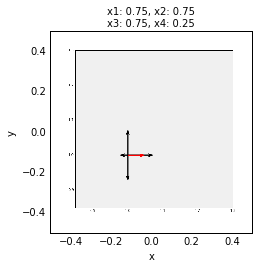
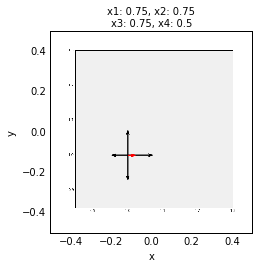
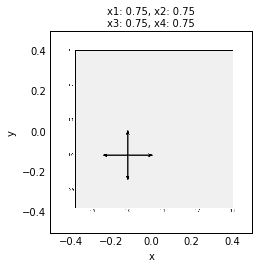

In [6]:
dimensions = ['x1','x2','x3','x4']
sections = hv.HoloMap(data, kdims=dimensions)
sections

In [4]:
len(data)

16

:Curve   [x]   (y)
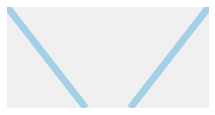

In [7]:
a = np.array([[np.pi/4],[3*np.pi/4]])
visualField(a,2)

In [8]:
en.E(a[0],a[1],[2,10])

array([ 2.93498118])

Libraries used nbagg and tornado for dynamic plots

<IPython.core.display.Javascript object>


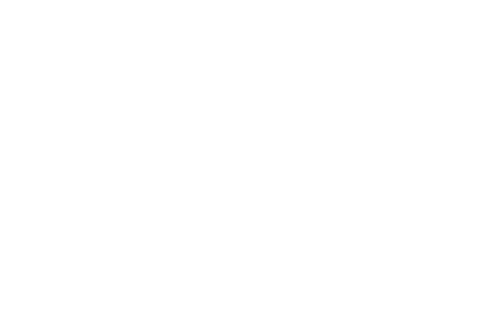

:Trisurface   [x,y,z]
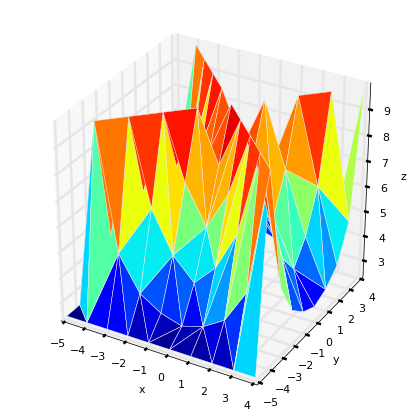

In [14]:
%%opts Trisurface [fig_size=200] (cmap='jet')
%matplotlib nbagg

hv.Trisurface((x.flat,y.flat,heights.flat))

In [13]:
heights = np.zeros([10,10])
for i in range(-5,5):
    for j in range(-5,5):
        heights[i,j] = en.E(a[0],a[1],[i,j])
heights

array([[ 2.4674011 ,  2.4674011 ,  2.4674011 ,  2.4674011 ,  2.4674011 ,
         2.4674011 ,  2.4674011 ,  2.4674011 ,  2.4674011 ,  2.4674011 ],
       [ 2.4674011 ,  9.8696044 ,  5.04703036,  3.70968213,  3.18757564,
         2.93498118,  3.18757564,  3.70968213,  5.04703036,  9.8696044 ],
       [ 2.4674011 ,  5.04703036,  9.8696044 ,  6.61636584,  5.04703036,
         4.20482234,  5.04703036,  6.61636584,  9.8696044 ,  5.04703036],
       [ 2.4674011 ,  3.70968213,  6.61636584,  9.8696044 ,  7.43652522,
         5.97203994,  7.43652522,  9.8696044 ,  6.61636584,  3.70968213],
       [ 2.4674011 ,  3.18757564,  5.04703036,  7.43652522,  9.8696044 ,
         7.93070517,  9.8696044 ,  7.43652522,  5.04703036,  3.18757564],
       [ 2.4674011 ,  2.93498118,  4.20482234,  5.97203994,  7.93070517,
         9.8696044 ,  7.93070517,  5.97203994,  4.20482234,  2.93498118],
       [ 2.4674011 ,  3.18757564,  5.04703036,  7.43652522,  9.8696044 ,
         7.93070517,  9.8696044 ,  7.43652522

In [12]:
def energies(orien1, orient2):
    heights = np.zeros([10,10])
    for i in range(-5,5):
        for j in range(-5,5):
            heights[i,j] = en.E(orien1,orien2,[i,j])
    return heights

<IPython.core.display.Javascript object>


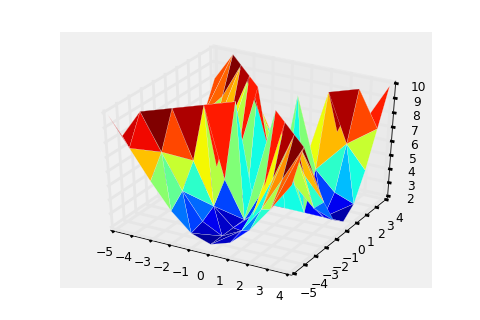

In [11]:
heights = np.zeros([100])
x = np.zeros([100])
y = np.zeros([100])
index = 0
for i in range(-5,5):
    for j in range(-5,5):
        heights[index] = en.E(a[0],a[1],[i,j])
        x[index] = i
        y[index] = j
        index = index + 1
fig = plt.figure()
ax = fig.gca(projection='3d')

ax.plot_trisurf(x, y, heights, cmap=plt.cm.jet, linewidth=0.2)

plt.show()